# **POESPIN -- EXPERIMENT NOTEBOOK RECORD**  
### "HOW CAN WE KNOW THE DANCER FROM THE DANCE?"- Yeatz (1865-1939)  
Mentor:   
Prof. Allison Parrish - NYU ITP/IMA: https://rwet.decontextualize.com/   
Prof. Marcel Oliver-Rose Truxillo: https://linktr.ee/mrt439  
  
Team:  
Cory Yihua Li(Director,AI Writting System,CGI) & Wendy Li(Director, Poet on the pole, Choreographer,CGI)    
Jiayi Li(Animator, Rigging, Cloth Design)--NYU ITP   
Archy Hongyue Cheng(English Literature&Poetry Consultant)--Universität Freiburg English Literatures and Literary Theory    
Reraner Yetong Xin (Curator,Art Director,3D Art)--Harvard GSD   

Consultant & Main Reference:    
Cheesetalk(Yuqian Sun)--AI Nvshu https://dl.acm.org/doi/10.1145/3610591.3616427,   
Weidi Zhang--Cangjie's Poetry https://dl.acm.org/doi/fullHtml/10.1145/3465619  

Poespin Experiment Process Record:  
This notebook documents the thought process and attempts for the entire project's data processing. The main contents are as follows:  

1. Initial Conception
2. Corpus Construction
3. Data Strategy
4. Results Comparison
5. Conclusion

## **1. Initial Conception**

Inspired by Martha Graham, the mother of modern dance, who said: 'DANCE IS THE HIDDEN LANGUAGE OF THE SOUL', we posed a question: "How can we transform dance into poetry?" Dance may represent the most primitive and direct form of human expression. It is not only an art form but also a means of communication rooted in our biological instincts.

This project aims to make an initial attempt at translating dance into poetry using a specific dance form: pole dancing. We collected motion capture data of pole dancer Wendy Li at the NYU Motion Capture Laboratory. By combining dance semantics and cultural background for data processing, we aim to explore the connection between human behavior and computational semantic space, and create a Dance to Poetry AI Art System.

Through observation, we found that pole dance movements are primarily circular. Dancers showcase their postures using core strength and limb extension/contraction, with climbing and inverted positions as expressive forms. Dance movements have unique and highly creative names: Flamingo, Full Moon, Phoenix... (https://www.onlinepolestudio.com/moves/pole/alphabetical/)

Based on these spatial and cultural semantic features, we initially developed three approaches:

### 1. AI Agent as choreographer and Poet making Poem Cycle    
Based on rotation angle => AI Agent (Vision API, BLIP Vision Recognition to identify the name of this movement) => Imagine dancer's intention → Form 2D circular poetry pattern) => One line for each tracker   
  
"Lianhuanshi" (连环诗), or "Linked-Ring Poetry," is a unique form of Chinese poetry. It typically refers to poems where the characters are interlocked, like interconnected rings, hence the name "Linked-Ring Poetry."  
The format of Lianhuanshi is usually arranged in a circular pattern. There's no limit to the number of characters used. There are many ways to read these poems, but generally, one starts from the central character at the top of the circle, then reads clockwise or counterclockwise. Every five or seven characters form a break, allowing the reader to create multiple five-character or seven-character poems.
Some Lianhuanshi works can be read starting from any character. Following a specific pattern, numerous poems can be formed (often in the style of classical Chinese poetry with the same number of characters per line).  https://baike.baidu.com/item/%E8%BF%9E%E7%8E%AF%E8%AF%97/1269439#:~:text=%E8%BF%9E%E7%8E%AF%E8%AF%97%EF%BC%8C%E6%98%AF%E4%B8%AD%E5%9B%BD%E8%AF%97,%E8%8B%A5%E5%B9%B2%E9%A6%96%E4%BA%94%E8%A8%80%E8%AF%97%E6%88%96%E4%B8%83%E8%A8%80%E8%AF%97%E3%80%82   

### 2. Dimensionality reduction space
TSNE/PCA dimensionality reduction and word distribution  
Local similarity, overall corpus structure => Tracker records  


### 3. Motion capture data dimensionality increase
Based on high-dimensional spatial perspective (word vector dimensionality increase) => Motion capture of four points: 3D → 300D => Read at high speed to extract points, then correspond to certain words => Sentence fragments



| Experimental Approach | AI Agent (Choreographer) | Process | Output |
|:----------------------|:-------------------------|:--------|:-------|
| Based on rotation angle | AI Agent (Choreographer) | Imagine dancer's intention → Form 2D circular poetry pattern | One line for each tracker |
| Based on 3D spatial angle (word vector dimensionality reduction) | AI Agent (Choreographer) | Associate dancer's body parts with symbols and punctuation (Who is writing) | Use tracker to record word forms and create circular poetry, or directly output what is touched and obtained without adjustment |
| | TSNE/PCA dimensionality reduction and word distribution <br> Local similarity, overall corpus structure | Tracker records <br> Write what kind of stuff | |
| Based on high-dimensional spatial angle (word vector dimensionality increase) | Motion capture of four points: 3D → ND | Read at high speed to extract points, then correspond to certain words | Sentence fragments |

## 2. Corpus Construction

The three data approaches mentioned above, especially the latter two, require us to have a corpus to implement. Following Archy's suggestion, we chose Yeats' poetry as the main source for our text, for two reasons:

1. [Dance | The Oxford Handbook of W.B. Yeats | Oxford Academic (oup.com)](https://academic.oup.com/edited-volume/28161/chapter-abstract/213252405?redirectedFrom=fulltext)

   Dance is a very important image in Yeats' poetry, not only as a crucial component in Yeats' theatrical performances but also as a reflection of his influence from Eastern culture.

2. The Yeats couple once experimented with the popular automatic writing. Yeats was a representative of symbolism and, like his predecessor Blake, believed that symbolic images should be obtained through "imagination" rather than from the real world. Therefore, they both strongly emphasized Vision (spiritual vision). It's somewhat like Platonism; they believed that inspiration and symbolic images were obtained from another world. Thus, in unconscious writing, they abandoned their own senses and resorted to "spiritual vision" and "imagination". Our combination of the semantic space constructed by TSNE and dance movements has a similar intention to automatic writing.

We collected Yeats' poems through the Gutenberg poetry collection. Considering the visual representation and the possibility of grammatically confusing and poorly readable results in the final output, in the process of tokenizing the poetry, we mainly separated short sentences, phrases, and some words (adjectives/verbs) and encapsulated them into a bag of words as JSON.

### Tokenization 1: Simple Word-level Tokenization

In [1]:
#降维Tsne探索实验
import spacy

# 加载英语模型
nlp = spacy.load("en_core_web_md")

# 读取poem1.txt文件内容
with open('poem1.txt', 'r') as file:
    text = file.read()

# 处理文本
doc = nlp(text)

# 提取名词、动词、形容词和副词
poetic_words = []
for token in doc:
    if token.pos_ in ['NOUN', 'VERB', 'ADJ', 'ADV']:
        poetic_words.append(token.text.lower())

# 创建词袋
word_bag = {}
for word in poetic_words:
    if word not in word_bag:
        word_bag[word] = 1
    else:
        word_bag[word] += 1

# 按词频降序排列词袋
sorted_word_bag = sorted(word_bag.items(), key=lambda x: x[1], reverse=True)

# 打印词袋
print("Poetic Word Bag:")
for word, freq in sorted_word_bag:
    print(f"{word}: {freq}")
    

Poetic Word Bag:
so: 20
street: 20
time: 14
old: 13
hair: 13
say: 11
here: 10
room: 10
have: 10
let: 10
then: 10
tea: 9
hands: 9
back: 9
all: 9
lamp: 9
man: 8
dry: 8
house: 8
window: 8
night: 8
evening: 8
hand: 8
white: 8
feet: 8
eyes: 8
said: 8
arms: 8
afternoon: 8
think: 7
now: 7
gives: 7
seen: 7
find: 7
much: 7
go: 7
known: 7
life: 7
see: 6
door: 6
has: 6
la: 6
end: 6
table: 6
-: 6
take: 6
know: 6
light: 6
smile: 6
friends: 6
smells: 6
too: 5
memory: 5
meet: 5
lost: 5
sea: 5
eye: 5
bed: 5
world: 5
air: 5
ends: 5
turn: 5
garden: 5
streets: 5
smoke: 5
days: 5
worth: 5
feel: 5
sleep: 4
head: 4
dark: 4
weave: 4
wind: 4
such: 4
many: 4
late: 4
only: 4
thought: 4
smell: 4
music: 4
left: 4
water: 4
knees: 4
smiles: 4
want: 4
talk: 4
never: 4
knew: 4
dead: 4
comes: 4
panes: 4
moon: 4
sit: 4
brown: 4
lady: 4
fall: 4
half: 4
question: 4
come: 4
yellow: 4
curled: 4
indeed: 4
dare: 4
morning: 4
fingers: 4
after: 4
at: 4
soul: 4
friend: 4
sure: 4
understand: 4
o'clock: 4
read: 3
gates: 3
bitten:

In [2]:
import spacy
from sklearn.decomposition import PCA
import numpy as np

# 加载英语模型
nlp = spacy.load("en_core_web_md")

# 读取poem1.txt文件内容
with open('poem1.txt', 'r') as file:
    text = file.read()

# 处理文本
doc = nlp(text)

# 提取名词、动词、形容词和副词
poetic_words = []
for token in doc:
    if token.pos_ in ['NOUN', 'VERB', 'ADJ', 'ADV']:
        poetic_words.append(token.text.lower())

# 去重
poetic_words = list(set(poetic_words))

# 获取词向量
word_vectors = []
for word in poetic_words:
    word_vectors.append(nlp(word).vector)

# 将词向量转换为NumPy数组
word_vectors = np.array(word_vectors)

# 使用PCA进行降维
pca = PCA(n_components=3)
reduced_vectors = pca.fit_transform(word_vectors)

# 创建词袋并导出坐标
word_bag = {}
for i, word in enumerate(poetic_words):
    word_bag[word] = {
        'x': reduced_vectors[i][0],
        'y': reduced_vectors[i][1],
        'z': reduced_vectors[i][2]
    }

# 打印词袋和坐标
print("Poetic Word Bag with Coordinates:")
for word, coords in word_bag.items():
    print(f"{word}: x={coords['x']:.4f}, y={coords['y']:.4f}, z={coords['z']:.4f}")

Poetic Word Bag with Coordinates:
epistle: x=-5.4367, y=0.6780, z=3.6055
walk: x=16.7860, y=1.6706, z=-8.1785
eternal: x=-2.9292, y=6.2061, z=2.9930
settles: x=-4.2334, y=7.8954, z=-1.4695
ears: x=17.8300, y=-4.7996, z=-5.4400
hear: x=9.9165, y=21.0384, z=-19.0047
cã´tes: x=4.9193, y=7.4120, z=9.1477
images: x=-10.0769, y=-13.3909, z=-2.3108
profit: x=-16.5225, y=1.7083, z=-0.1305
ague: x=-8.4341, y=7.1845, z=18.6819
bitten: x=3.6010, y=11.9704, z=3.8549
sustained: x=-17.0812, y=2.2896, z=5.4935
fugitive: x=-18.5373, y=8.7984, z=0.2850
overwhelming: x=-8.9084, y=4.5028, z=-6.1759
conferencier: x=4.9193, y=7.4120, z=9.1477
brown: x=12.6308, y=-15.1345, z=1.7509
precise: x=-7.1527, y=-5.0416, z=-8.3978
flesh: x=15.5578, y=1.4710, z=-4.4806
creeping: x=5.3703, y=-2.7414, z=0.0820
fog: x=21.4249, y=-11.9706, z=1.4146
days: x=-1.2620, y=-2.7704, z=3.2077
country: x=-20.5478, y=0.7307, z=1.8660
emphasis: x=-14.7871, y=1.7202, z=-2.6745
rolled: x=1.7707, y=-7.1267, z=8.4142
geranium: x=7.2288

In [3]:
import spacy
from sklearn.manifold import TSNE
import numpy as np
import json

# 加载英语模型
nlp = spacy.load("en_core_web_md")

# 读取poem1.txt文件内容
with open('poem1.txt', 'r') as file:
    text = file.read()

# 处理文本
doc = nlp(text)

# 提取名词、动词、形容词和副词
poetic_words = []
for token in doc:
    if token.pos_ in ['NOUN', 'VERB', 'ADJ', 'ADV']:
        poetic_words.append(token.text.lower())

# 去重
poetic_words = list(set(poetic_words))

# 获取词向量
word_vectors = []
for word in poetic_words:
    word_vectors.append(nlp(word).vector)

# 将词向量转换为NumPy数组
word_vectors = np.array(word_vectors)

# 使用t-SNE进行降维
tsne = TSNE(n_components=3, random_state=42)
reduced_vectors = tsne.fit_transform(word_vectors)

# 创建词袋并导出坐标
word_bag = {}
for i, word in enumerate(poetic_words):
    word_bag[word] = {
        'x': float(reduced_vectors[i][0]),
        'y': float(reduced_vectors[i][1]),
        'z': float(reduced_vectors[i][2])
    }

# 将词袋和坐标导出为JSON文件
with open('word_bag_tsne.json', 'w') as json_file:
    json.dump(word_bag, json_file, indent=4)

print("Word bag and coordinates exported to word_bag_tsne.json.")

Word bag and coordinates exported to word_bag_tsne.json.


### Tokenization 2 (Phrases)

           Phrase  Frequency
0    ancient ways          4
1        of years          4
2      white feet          4
3     human child          4
4   to the waters          4
5    with a faery          4
6         in hand          4
7          so let          4
8      of weeping          4
9         of love          4
10     old priest          4
11    white birds          3
12     in silence          3
13    white stars          3
14        at play          3
15     of the sea          3
16     in all men          3
17       of stars          3
18     legged fly          3
19       of heart          3


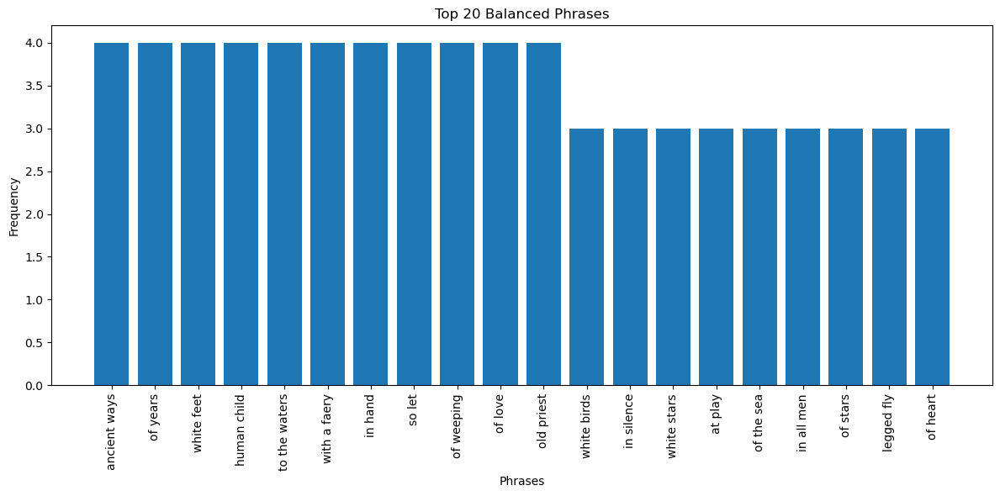

Results saved to balanced_poetic_phrases.csv


In [4]:
import json
import spacy
from collections import Counter
import pandas as pd
import matplotlib.pyplot as plt
from spacy.matcher import Matcher

# Load the English language model
nlp = spacy.load("en_core_web_md")

def extract_balanced_phrases(doc):
    matcher = Matcher(nlp.vocab)
    
    # Pattern for Adjective + Noun
    matcher.add("ADJ_NOUN", [[{"POS": "ADJ"}, {"POS": "NOUN"}]])
    
    # Pattern for Verb + (Adjective) + Noun
    matcher.add("VERB_OBJ", [[{"POS": "VERB"}, {"POS": "ADJ", "OP": "?"}, {"POS": "NOUN"}]])
    
    # Pattern for Adverb + Verb
    matcher.add("ADV_VERB", [[{"POS": "ADV"}, {"POS": "VERB"}]])
    
    # Pattern for Preposition + Noun
    matcher.add("PREP_NOUN", [[{"POS": "ADP"}, {"POS": "DET", "OP": "?"}, {"POS": "ADJ", "OP": "?"}, {"POS": "NOUN"}]])

    matches = matcher(doc)
    
    phrases = []
    for match_id, start, end in matches:
        span = doc[start:end]
        if 2 <= len(span.text.split()) <= 4:  # Ensure phrase length is between 2 and 4 words
            phrases.append(span.text.lower())
    
    return phrases

def process_poems(json_data):
    all_phrases = []
    
    for poem in json_data['poems']:
        doc = nlp(poem['content'])
        phrases = extract_balanced_phrases(doc)
        all_phrases.extend(phrases)
    
    return Counter(all_phrases)

# Load JSON data
with open("yeats-poems-dancerealted.json", 'r', encoding='utf-8') as f:
    data = json.load(f)

# Process poems
phrase_counter = process_poems(data)

# Convert to DataFrame
df = pd.DataFrame(phrase_counter.items(), columns=['Phrase', 'Frequency'])
df = df.sort_values('Frequency', ascending=False).reset_index(drop=True)

# Display top 20 phrases
print(df.head(20))

# Plot top 20 phrases
plt.figure(figsize=(12, 6))
plt.bar(df['Phrase'][:20], df['Frequency'][:20])
plt.xticks(rotation=90)
plt.title("Top 20 Balanced Phrases")
plt.xlabel("Phrases")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

# Export to CSV
df.to_csv("balanced_poetic_phrases.csv", index=False)
print("Results saved to balanced_poetic_phrases.csv")

       Combination  Frequency
0        near_come          9
1    leave_flutter          6
2         have_day          5
3       old_priest          4
4       wild_water          4
5      human_child          4
6       white_foot          4
7      ancient_way          4
8     know_phoenix          4
9           so_let          4
10      away_drive          3
11      white_bird          3
12       young_man          3
13     name_friend          3
14      legged_fly          3
15      white_star          3
16   strange_thing          3
17  little_childer          3
18         away_go          3
19    common_thing          3


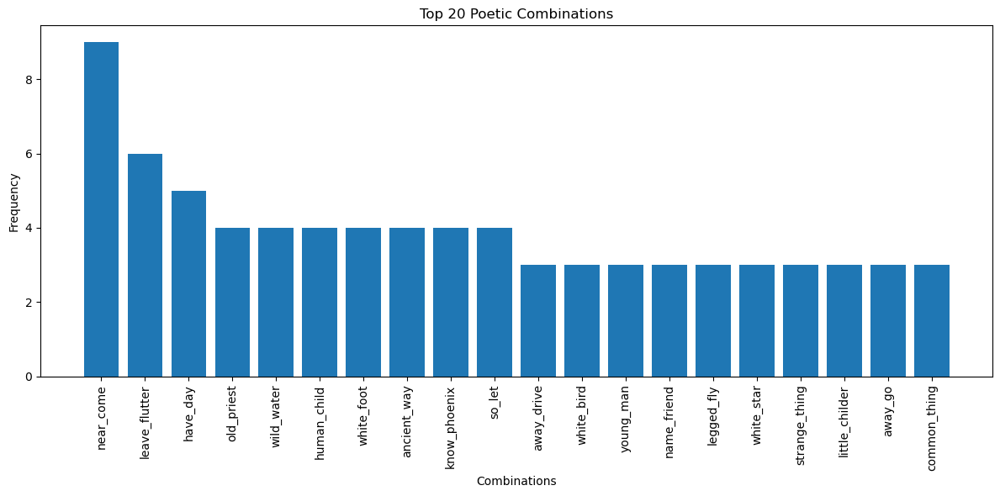

Results saved to poetic_combinations.csv


In [5]:
import json
import csv
import spacy
from collections import Counter
import pandas as pd
import matplotlib.pyplot as plt

# Load the English language model
nlp = spacy.load("en_core_web_md")

def extract_poetic_combinations(doc):
    combinations = []
    for token in doc:
        if token.pos_ in ["VERB", "NOUN", "ADJ", "ADV"]:
            # Verb + Noun
            if token.pos_ == "VERB":
                for child in token.children:
                    if child.dep_ == "dobj" and child.pos_ == "NOUN":
                        combinations.append(f"{token.lemma_}_{child.lemma_}")
            
            # Adjective + Noun
            if token.pos_ == "ADJ":
                if token.head.pos_ == "NOUN":
                    combinations.append(f"{token.lemma_}_{token.head.lemma_}")
            
            # Adverb + Verb
            if token.pos_ == "ADV":
                if token.head.pos_ == "VERB":
                    combinations.append(f"{token.lemma_}_{token.head.lemma_}")
    
    return combinations

def process_poems(json_data):
    all_combinations = []
    
    for poem in json_data['poems']:
        doc = nlp(poem['content'])
        combinations = extract_poetic_combinations(doc)
        all_combinations.extend(combinations)
    
    return Counter(all_combinations)

# Load JSON data
with open("yeats-poems-dancerealted.json", 'r', encoding='utf-8') as f:
    data = json.load(f)

# Process poems
combination_counter = process_poems(data)

# Convert to DataFrame
df = pd.DataFrame(combination_counter.items(), columns=['Combination', 'Frequency'])
df = df.sort_values('Frequency', ascending=False).reset_index(drop=True)

# Display top 20 combinations
print(df.head(20))

# Plot top 20 combinations
plt.figure(figsize=(12, 6))
plt.bar(df['Combination'][:20], df['Frequency'][:20])
plt.xticks(rotation=90)
plt.title("Top 20 Poetic Combinations")
plt.xlabel("Combinations")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

# Export to CSV
df.to_csv("poetic_combinations.csv", index=False)
print("Results saved to poetic_combinations.csv")

Extracted dance terms: ['sing', 'rage', 'turning', 'sweet', 'chase', 'hear', 'shade', 'wary', 'footstep', 'image', 'fitful', 'think', 'man', 'one', 'go', 'creel', 'whirl', 'faerie', 'step', 'head', 'outdance', 'leafy', 'golden', 'slide', 'melody', 'return', 'toss', 'hand', 'stand', 'turn', 'undo', 'cracked', 'band', 'mind', 'gather', 'cannon', 'swan', 'land', 'leap', 'brood', 'mortal', 'wandering', 'slow', 'pulse', 'glide', 'dancing', 'shake', 'right', 'crown', 'chinese', 'finger', 'fix', 'wildere', 'bee', 'mirthful', 'daughter', 'priest', 'truth', 'shy', 'instep', 'hurry', 'run', 'hope', 'spinning', 'fire', 'dance', 'dancer', 'more', 'olden', 'toil', 'dart', 'full', 'tongue', 'high', 'round', 'thing', 'eyeball', 'move', 'beat', 'silver', 'die', 'song', 'movement', 'sway', 'glow', 'hold', 'see', 'purr', 'music', 'whirling', 'heavy', 'peahen', 'loud', 'wizard', 'grasshopper', 'tread', 'life', 'druid', 'year', 'dreary', 'dream', 'turnin', 'unloved', 'parrot', 'tune', 'seem']
            

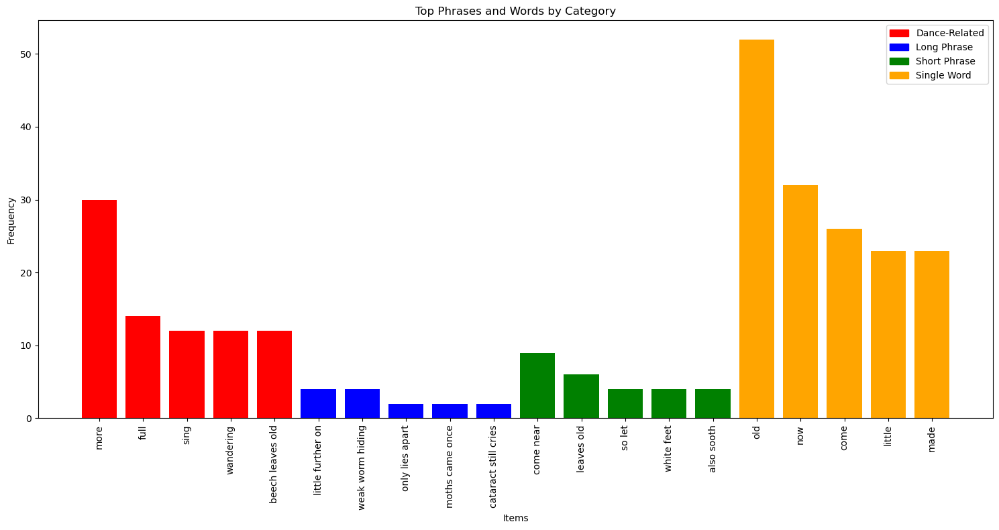

Results saved to comprehensive_poetic_analysis.csv


In [6]:
import json
import spacy
from collections import Counter
import pandas as pd
import matplotlib.pyplot as plt
from spacy.matcher import Matcher, PhraseMatcher

# Load the English language model
nlp = spacy.load("en_core_web_md")

# Define a broader list of dance-related roots and terms
dance_roots = ['danc', 'choreograph', 'ballet', 'waltz', 'tango', 'jig', 'reel', 'twirl', 'spin', 'leap', 'pirouette', 'sway', 'rhythm']
movement_terms = ['move', 'step', 'turn', 'glide', 'slide', 'jump', 'hop', 'skip', 'whirl']
music_terms = ['music', 'song', 'melody', 'tune', 'rhythm', 'beat', 'tempo']

def extract_dance_terms(json_data):
    dance_terms = set()
    phrase_matcher = PhraseMatcher(nlp.vocab)
    
    # Add patterns for multi-word terms
    patterns = [nlp(term) for term in ['dance floor', 'dance hall', 'dance music', 'dance performance']]
    phrase_matcher.add("DANCE_PHRASES", patterns)
    
    for poem in json_data['poems']:
        doc = nlp(poem['content'].lower())
        
        # Check for dance roots and related terms
        for token in doc:
            if any(root in token.lemma_ for root in dance_roots) or \
               any(term in token.lemma_ for term in movement_terms + music_terms):
                dance_terms.add(token.lemma_)
                # Add surrounding words to capture related terms
                for child in token.children:
                    if child.pos_ in ["ADJ", "NOUN", "VERB"]:
                        dance_terms.add(child.lemma_)
        
        # Check for multi-word dance terms
        matches = phrase_matcher(doc)
        for match_id, start, end in matches:
            span = doc[start:end]
            dance_terms.add(span.text)
    
    return list(dance_terms)

def extract_phrases_and_words(doc, dance_terms):
    matcher = Matcher(nlp.vocab)
    
    # Pattern for longer phrases (3-6 words)
    matcher.add("LONG_PHRASE", [[{"POS": {"IN": ["ADJ", "NOUN", "VERB", "ADV"]}}, 
                                 {"POS": {"IN": ["ADJ", "NOUN", "VERB", "ADV"]}}, 
                                 {"POS": {"IN": ["ADJ", "NOUN", "VERB", "ADV"]}},
                                 {"POS": {"IN": ["ADJ", "NOUN", "VERB", "ADV"]}, "OP": "?"},
                                 {"POS": {"IN": ["ADJ", "NOUN", "VERB", "ADV"]}, "OP": "?"},
                                 {"POS": {"IN": ["ADJ", "NOUN", "VERB", "ADV"]}, "OP": "?"}]])
    
    # Pattern for shorter phrases (2-3 words)
    matcher.add("SHORT_PHRASE", [[{"POS": {"IN": ["ADJ", "NOUN", "VERB", "ADV"]}}, 
                                  {"POS": {"IN": ["ADJ", "NOUN", "VERB", "ADV"]}},
                                  {"POS": {"IN": ["ADJ", "NOUN", "VERB", "ADV"]}, "OP": "?"}]])

    matches = matcher(doc)
    
    phrases_and_words = []
    for match_id, start, end in matches:
        span = doc[start:end]
        phrases_and_words.append(span.text.lower())
    
    # Add individual emotional words (verbs, adjectives, adverbs)
    for token in doc:
        if token.pos_ in ["VERB", "ADJ", "ADV"] and token.is_alpha and len(token.text) > 2:
            phrases_and_words.append(token.text.lower())
    
    return phrases_and_words

def process_poems(json_data, dance_terms):
    all_items = []
    
    for poem in json_data['poems']:
        doc = nlp(poem['content'])
        items = extract_phrases_and_words(doc, dance_terms)
        all_items.extend(items)
    
    return Counter(all_items)

# Load JSON data
with open("yeats-poems-dancerealted.json", 'r', encoding='utf-8') as f:
    data = json.load(f)

# Extract dance terms from the data
dance_terms = extract_dance_terms(data)
print("Extracted dance terms:", dance_terms)

# Process poems
item_counter = process_poems(data, dance_terms)

# Convert to DataFrame
df = pd.DataFrame(item_counter.items(), columns=['Item', 'Frequency'])
df = df.sort_values('Frequency', ascending=False).reset_index(drop=True)

# Categorize items
def categorize_item(item, dance_terms):
    if any(term in item for term in dance_terms):
        return 'Dance-Related'
    elif len(item.split()) > 2:
        return 'Long Phrase'
    elif len(item.split()) == 2:
        return 'Short Phrase'
    else:
        return 'Single Word'

df['Category'] = df['Item'].apply(lambda x: categorize_item(x, dance_terms))

# Display top items from each category
categories = ['Dance-Related', 'Long Phrase', 'Short Phrase', 'Single Word']
top_items = pd.concat([df[df['Category'] == cat].head(5) for cat in categories])
print(top_items)

# Plot top items
plt.figure(figsize=(15, 8))
colors = {'Dance-Related': 'red', 'Long Phrase': 'blue', 'Short Phrase': 'green', 'Single Word': 'orange'}
bars = plt.bar(top_items['Item'], top_items['Frequency'], color=top_items['Category'].map(colors))
plt.xticks(rotation=90)
plt.title("Top Phrases and Words by Category")
plt.xlabel("Items")
plt.ylabel("Frequency")
plt.legend(handles=[plt.Rectangle((0,0),1,1, color=colors[cat]) for cat in categories], labels=categories)
plt.tight_layout()
plt.show()

# Export to CSV
df.to_csv("comprehensive_poetic_analysis.csv", index=False)
print("Results saved to comprehensive_poetic_analysis.csv")

Top items:
      Frequency                Text       Category
745           1              But O!   Short_Phrase
1281          1  "Mavrone, mavrone!   Short_Phrase
1297          1     you come again!   Short_Phrase
45            6       leave flutter      Verb_Noun
65            5            have day      Verb_Noun
91            4        know phoenix      Verb_Noun
116           3          have peace      Verb_Noun
118           3         name friend      Verb_Noun
75            4          white foot       Adj_Noun
76            4          wild water       Adj_Noun
78            4         human child       Adj_Noun
98            4          old priest       Adj_Noun
102           4         ancient way       Adj_Noun
24            9           near come       Adv_Verb
89            4              so let       Adv_Verb
132           3             away go       Adv_Verb
161           3           away come       Adv_Verb
162           3          away drive       Adv_Verb
243           2     

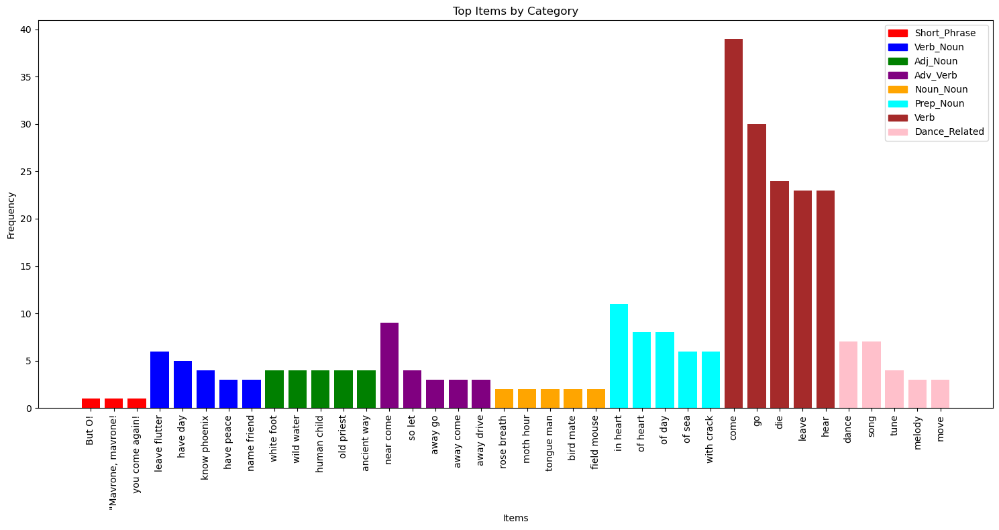

Results saved to yeats_style_items.csv and yeats_full_lines.csv


In [7]:
import json
import spacy
from collections import Counter
import pandas as pd
import matplotlib.pyplot as plt

# Load the English language model
nlp = spacy.load("en_core_web_md")

# Define dance-related terms
dance_terms = set(['dance', 'choreograph', 'ballet', 'waltz', 'tango', 'jig', 'reel', 'twirl', 'spin', 'leap', 'pirouette', 'sway', 'rhythm',
                   'move', 'step', 'turn', 'glide', 'slide', 'jump', 'hop', 'skip', 'whirl',
                   'music', 'song', 'melody', 'tune', 'beat', 'tempo'])

def extract_items(doc):
    items = []
    for sent in doc.sents:
        # Extract short phrases (3-5 words)
        if 3 <= len(sent) <= 5:
            items.append((sent.text, "Short_Phrase"))
        
        for token in sent:
            if token.pos_ in ["VERB", "NOUN", "ADJ", "ADV", "ADP"]:
                # Verb + Noun
                if token.pos_ == "VERB":
                    for child in token.children:
                        if child.dep_ == "dobj" and child.pos_ == "NOUN":
                            items.append((f"{token.lemma_} {child.lemma_}", "Verb_Noun"))
                
                # Adjective + Noun
                if token.pos_ == "ADJ":
                    if token.head.pos_ == "NOUN":
                        items.append((f"{token.lemma_} {token.head.lemma_}", "Adj_Noun"))
                
                # Adverb + Verb
                if token.pos_ == "ADV":
                    if token.head.pos_ == "VERB":
                        items.append((f"{token.lemma_} {token.head.lemma_}", "Adv_Verb"))
                
                # Noun + Noun (compound nouns)
                if token.pos_ == "NOUN":
                    for child in token.children:
                        if child.dep_ == "compound" and child.pos_ == "NOUN":
                            items.append((f"{child.lemma_} {token.lemma_}", "Noun_Noun"))
                
                # Preposition + Noun
                if token.pos_ == "ADP":
                    for child in token.children:
                        if child.pos_ == "NOUN":
                            items.append((f"{token.lemma_} {child.lemma_}", "Prep_Noun"))
                
                # Important verbs and dance-related words
                if token.pos_ == "VERB" and token.is_stop == False:
                    items.append((token.lemma_, "Verb"))
                elif token.lemma_ in dance_terms:
                    items.append((token.lemma_, "Dance_Related"))
    
    return items

def process_poems(json_data):
    all_items = []
    all_lines = []
    
    for poem in json_data['poems']:
        doc = nlp(poem['content'])
        items = extract_items(doc)
        all_items.extend(items)
        
        # Extract full lines
        lines = [sent.text.strip() for sent in doc.sents]
        all_lines.extend(lines)
    
    return Counter(all_items), Counter(all_lines)

# Load JSON data
with open("yeats-poems-dancerealted.json", 'r', encoding='utf-8') as f:
    data = json.load(f)

# Process poems
item_counter, line_counter = process_poems(data)

# Convert items to DataFrame
df_items = pd.DataFrame(item_counter.items(), columns=['Item', 'Frequency'])
df_items[['Text', 'Category']] = pd.DataFrame(df_items['Item'].tolist(), index=df_items.index)
df_items = df_items.drop('Item', axis=1)
df_items = df_items.sort_values('Frequency', ascending=False).reset_index(drop=True)

# Convert lines to DataFrame
df_lines = pd.DataFrame(line_counter.items(), columns=['Line', 'Frequency'])
df_lines = df_lines.sort_values('Frequency', ascending=False).reset_index(drop=True)

# Display top items from each category
categories = ['Short_Phrase', 'Verb_Noun', 'Adj_Noun', 'Adv_Verb', 'Noun_Noun', 'Prep_Noun', 'Verb', 'Dance_Related']
top_items = pd.concat([df_items[df_items['Category'] == cat].head(5) for cat in categories])
print("Top items:")
print(top_items)

# Display top lines
print("\nTop lines:")
print(df_lines.head(10))

# Plot top items
plt.figure(figsize=(15, 8))
colors = {'Short_Phrase': 'red', 'Verb_Noun': 'blue', 'Adj_Noun': 'green', 'Adv_Verb': 'purple', 
          'Noun_Noun': 'orange', 'Prep_Noun': 'cyan', 'Verb': 'brown', 'Dance_Related': 'pink'}
bars = plt.bar(top_items['Text'], top_items['Frequency'], color=top_items['Category'].map(colors))
plt.xticks(rotation=90)
plt.title("Top Items by Category")
plt.xlabel("Items")
plt.ylabel("Frequency")
plt.legend(handles=[plt.Rectangle((0,0),1,1, color=colors[cat]) for cat in categories], labels=categories)
plt.tight_layout()
plt.show()

# Export to CSV
df_items.to_csv("yeats_style_items.csv", index=False)
df_lines.to_csv("yeats_full_lines.csv", index=False)
print("Results saved to yeats_style_items.csv and yeats_full_lines.csv")

### Observing the Differences between TSNE and PCA

In [8]:
import json
import plotly.graph_objects as go
from sklearn.neighbors import NearestNeighbors

# 读取PCA结果
with open('word_bag.json', 'r') as f:
    pca_data = json.load(f)

# 读取t-SNE结果
with open('word_bag_tsne.json', 'r') as f:
    tsne_data = json.load(f)

# 限制可视化的词汇数量
max_words = 100

# 提取PCA坐标和词汇
pca_coords = [[coord['x'], coord['y'], coord['z']] for coord in list(pca_data.values())[:max_words]]
pca_words = list(pca_data.keys())[:max_words]

# 提取t-SNE坐标和词汇
tsne_coords = [[coord['x'], coord['y'], coord['z']] for coord in list(tsne_data.values())[:max_words]]
tsne_words = list(tsne_data.keys())[:max_words]

# 计算PCA的邻居关系
pca_nbrs = NearestNeighbors(n_neighbors=3, algorithm='ball_tree').fit(pca_coords)
pca_distances, pca_indices = pca_nbrs.kneighbors(pca_coords)

# 计算t-SNE的邻居关系
tsne_nbrs = NearestNeighbors(n_neighbors=3, algorithm='ball_tree').fit(tsne_coords)
tsne_distances, tsne_indices = tsne_nbrs.kneighbors(tsne_coords)

# 创建PCA的3D散点图和邻居连线
pca_trace = go.Scatter3d(
    x=[coord[0] for coord in pca_coords],
    y=[coord[1] for coord in pca_coords],
    z=[coord[2] for coord in pca_coords],
    mode='markers+text',
    marker=dict(size=5, color='blue', opacity=0.8),
    text=pca_words,
    name='PCA'
)

pca_edges = []
for i in range(len(pca_coords)):
    for j in pca_indices[i][1:]:
        pca_edges.append(go.Scatter3d(
            x=[pca_coords[i][0], pca_coords[j][0]],
            y=[pca_coords[i][1], pca_coords[j][1]],
            z=[pca_coords[i][2], pca_coords[j][2]],
            mode='lines',
            line=dict(color='lightblue', width=1),
            showlegend=False
        ))

# 创建t-SNE的3D散点图和邻居连线
tsne_trace = go.Scatter3d(
    x=[coord[0] for coord in tsne_coords],
    y=[coord[1] for coord in tsne_coords],
    z=[coord[2] for coord in tsne_coords],
    mode='markers+text',
    marker=dict(size=5, color='red', opacity=0.8),
    text=tsne_words,
    name='t-SNE'
)

tsne_edges = []
for i in range(len(tsne_coords)):
    for j in tsne_indices[i][1:]:
        tsne_edges.append(go.Scatter3d(
            x=[tsne_coords[i][0], tsne_coords[j][0]],
            y=[tsne_coords[i][1], tsne_coords[j][1]],
            z=[tsne_coords[i][2], tsne_coords[j][2]],
            mode='lines',
            line=dict(color='pink', width=1),
            showlegend=False
        ))

# 创建布局
layout = go.Layout(
    title=f'PCA vs t-SNE: 3D Visualization with Neighbors (Top {max_words} Words)',
    scene=dict(
        xaxis=dict(title='X'),
        yaxis=dict(title='Y'),
        zaxis=dict(title='Z')
    )
)

# 创建图形对象
fig = go.Figure(data=[pca_trace, *pca_edges, tsne_trace, *tsne_edges], layout=layout)

# 显示图形
fig.show()

### Files Needed for Word Vector Visualization

Google Embedding Projector:     
Requires 2 tsv files: 1 for point coordinates, 1 for point names  

Installing Python pip library packages in TouchDesigner: https://olib.amb-service.net/component/td-pip  

To just install a package, run:
```python
op('td_pip').InstallPackage(package_name)


In [9]:
import csv
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.manifold import TSNE

# 读取CSV文件
texts = []
categories = []
with open('yeats_style_items.csv', 'r', encoding='utf-8') as f:
    reader = csv.reader(f)
    next(reader)  # 跳过标题行
    for row in reader:
        texts.append(row[1])  # 文本在第二列
        categories.append(row[2])  # 类别在第三列

# 创建词袋模型
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(texts)

# 使用t-SNE进行降维
tsne = TSNE(n_components=3, random_state=42)
X_tsne = tsne.fit_transform(X.toarray())

# 创建向量TSV文件
with open('vectors.tsv', 'w', newline='', encoding='utf-8') as f:
    writer = csv.writer(f, delimiter='\t')
    for vector in X_tsne:
        writer.writerow(vector)

# 创建元数据TSV文件
with open('metadata.tsv', 'w', newline='', encoding='utf-8') as f:
    writer = csv.writer(f, delimiter='\t')
    writer.writerow(['Text', 'Category'])  # 写入标题行
    for text, category in zip(texts, categories):
        writer.writerow([text, category])

print("已创建文件：vectors.tsv 和 metadata.tsv")

已创建文件：vectors.tsv 和 metadata.tsv


### Linked-Ring Poetry Strategy

Lianhuanshi (连环诗), or "Linked-Ring Poetry," is a unique form of Chinese poetry. It typically refers to poems where the characters are interlocked, like interconnected rings, hence the name "Linked-Ring Poetry."

The format of Lianhuanshi is usually arranged in a circular pattern. There's no limit to the number of characters used. There are many ways to read these poems, but generally, one starts from the central character at the top of the circle, then reads clockwise or counterclockwise. Every five or seven characters form a break, allowing the reader to create multiple five-character or seven-character poems. Some Lianhuanshi works can be read starting from any character. Following a specific pattern, numerous poems can be formed (often in the style of classical Chinese poetry with the same number of characters per line).

Given that pole dancing movements are primarily circular, we use this strategy to generate poetry.

Dataset: https://www.onlinepolestudio.com/moves/pole/alphabetical/browse-0-120/

Process:
BLIP (Vision Recognition) => Identify what pole dance move the dancer is performing => Prompt Engineering => Generate a 14-character poem


#### Fine-tuning the Model

It's not very suitable to do this in a notebook. It's best to handle this separately in VSCode.

In [10]:
import torch
from torch.utils.data import Dataset, DataLoader
from torch.cuda.amp import autocast, GradScaler
from PIL import Image
import json
import requests
import os
from transformers import BlipProcessor, BlipForConditionalGeneration
from tqdm import tqdm
import concurrent.futures
import logging
import gc

# 设置日志
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# 设置设备  
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
logging.info(f"Using device: {device}")

# GPU 缓存清理函数
def clear_gpu_cache():
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        gc.collect()  
        logging.info("GPU cache cleared")
    else:
        logging.info("No GPU available, cache clearing not needed")

# 定义辅助函数
def download_image(item):
    image_url = item['image']
    image_name = os.path.basename(image_url)
    local_path = os.path.join('downloaded_images', image_name)

    if not os.path.exists(local_path):
        try:
            response = requests.get(image_url, timeout=10)
            response.raise_for_status()
            with open(local_path, 'wb') as f:
                f.write(response.content)  
            return local_path
        except Exception as e:
            logging.error(f"Error downloading {image_url}: {e}") 
            return None
    return local_path

def predownload_images(json_file):
    with open(json_file, 'r') as f:
        data = json.load(f)

    os.makedirs('downloaded_images', exist_ok=True)

    with concurrent.futures.ThreadPoolExecutor(max_workers=10) as executor:
        futures = [executor.submit(download_image, item) for item in data]
        for future in tqdm(concurrent.futures.as_completed(futures), total=len(data), desc="Downloading images"):
            pass

# 定义数据集类  
class PoleDanceDataset(Dataset):
    def __init__(self, json_file, processor):
        with open(json_file, 'r') as f:
            self.data = json.load(f)
        self.processor = processor

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image_url = item['image']
        image_name = os.path.basename(image_url)
        local_path = os.path.join('downloaded_images', image_name)
        caption = item['caption']

        try:
            image = Image.open(local_path).convert('RGB')
        except Exception as e:
            logging.error(f"Error opening image {local_path}: {e}")
            return None

        try:  
            inputs = self.processor(images=image, text=caption, return_tensors="pt", padding="max_length", max_length=32, truncation=True)
            inputs = {k: v.squeeze(0) for k, v in inputs.items()}
        except Exception as e:
            logging.error(f"Error processing image {local_path}: {e}")
            return None

        return inputs

# 定义一个可序列化的collate函数
def collate_fn(batch):  
    return [item for item in batch if item is not None]

# 生成描述函数
def generate_caption(model, processor, image_path):
    model.eval()
    if os.path.exists(image_path):
        image = Image.open(image_path).convert('RGB') 
        inputs = processor(images=image, return_tensors="pt").to(device)

        with torch.no_grad():
            generated_ids = model.generate(**inputs, max_length=20)  
            generated_caption = processor.decode(generated_ids[0], skip_special_tokens=True)
            return generated_caption
    else:
        logging.warning(f"Image not found: {image_path}")
        return None

# 主程序
def main():
    json_file = 'pole-dance-gestrure-name-data.json'

    logging.info("Pre-downloading images...")
    predownload_images(json_file)

    logging.info("Loading model and processor...")
    processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base") 
    model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")
    model.to(device)

    logging.info("Creating dataset and dataloader...")
    dataset = PoleDanceDataset(json_file, processor)
    dataloader = DataLoader(dataset, batch_size=2, shuffle=True, num_workers=0, collate_fn=collate_fn)

    optimizer = torch.optim.AdamW(model.parameters(), lr=5e-5)
    scaler = GradScaler()
    accumulation_steps = 4  # 梯度累积步数

    num_epochs = 60

    # 在训练开始前清理 GPU 缓存
    clear_gpu_cache() 

    for epoch in range(num_epochs):
        model.train()
        total_loss = 0
        progress_bar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{num_epochs}")
        optimizer.zero_grad()

        for i, batch in enumerate(progress_bar):
            if not batch:  # 跳过空批次
                continue

            input_ids = torch.stack([item['input_ids'] for item in batch]).to(device) 
            pixel_values = torch.stack([item['pixel_values'] for item in batch]).to(device)
            attention_mask = torch.stack([item['attention_mask'] for item in batch]).to(device)

            with autocast():
                outputs = model(input_ids=input_ids,  
                                pixel_values=pixel_values,
                                attention_mask=attention_mask,
                                labels=input_ids)

            loss = outputs.loss
            total_loss += loss.item()

            scaler.scale(loss).backward()

            if (i + 1) % accumulation_steps == 0:
                scaler.step(optimizer)
                scaler.update()
                optimizer.zero_grad()

            progress_bar.set_postfix({'loss': loss.item()}) 

        avg_loss = total_loss / len(dataloader)
        logging.info(f"Epoch {epoch+1}/{num_epochs}, Average Loss: {avg_loss:.4f}")

    logging.info("Saving final fine-tuned model and processor...") 
    model.save_pretrained("finetuned_blip_pole_dance")
    processor.save_pretrained("finetuned_blip_pole_dance")

    logging.info("Testing model...")
    model = BlipForConditionalGeneration.from_pretrained("finetuned_blip_pole_dance")
    processor = BlipProcessor.from_pretrained("finetuned_blip_pole_dance")  
    model.to(device)

    test_image_path = os.path.join('downloaded_images', 'speedbump.jpg')
    caption = generate_caption(model, processor, test_image_path)
    if caption:
        logging.info(f"Generated caption: {caption}")

if __name__ == "__main__":
    try:
        main()
    except Exception as e:
        logging.exception("An error occurred during execution:")

2025-04-06 22:46:52,598 - INFO - Using device: cuda
2025-04-06 22:46:52,600 - INFO - Pre-downloading images...
2025-04-06 22:46:52,625 - INFO - Loading model and processor...


preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

2025-04-06 22:49:09,490 - INFO - Creating dataset and dataloader...
2025-04-06 22:49:09,661 - INFO - GPU cache cleared
Epoch 1/60: 100%|██████████| 70/70 [00:17<00:00,  4.07it/s, loss=8.07]
2025-04-06 22:49:26,876 - INFO - Epoch 1/60, Average Loss: 9.9775
Epoch 2/60: 100%|██████████| 70/70 [00:14<00:00,  4.79it/s, loss=6.43]
2025-04-06 22:49:41,496 - INFO - Epoch 2/60, Average Loss: 7.1979
Epoch 3/60: 100%|██████████| 70/70 [00:15<00:00,  4.65it/s, loss=4.24]
2025-04-06 22:49:56,565 - INFO - Epoch 3/60, Average Loss: 5.3051
Epoch 4/60: 100%|██████████| 70/70 [00:15<00:00,  4.41it/s, loss=2.41]
2025-04-06 22:50:12,456 - INFO - Epoch 4/60, Average Loss: 3.2851
Epoch 5/60: 100%|██████████| 70/70 [00:17<00:00,  4.04it/s, loss=1.77]
2025-04-06 22:50:29,796 - INFO - Epoch 5/60, Average Loss: 2.0237
Epoch 6/60: 100%|██████████| 70/70 [00:18<00:00,  3.81it/s, loss=1.59]
2025-04-06 22:50:48,189 - INFO - Epoch 6/60, Average Loss: 1.6628
Epoch 7/60: 100%|██████████| 70/70 [00:18<00:00,  3.78it/s,

#### Using a Pre-trained Model for Recognition and as Part of the Prompt to Link with LLM

In [13]:
!pip install anthropic

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
  Obtaining dependency information for anthropic from https://files.pythonhosted.org/packages/76/74/5d90ad14d55fbe3f9c474fdcb6e34b4bed99e3be8efac98734a5ddce88c1/anthropic-0.49.0-py3-none-any.whl.metadata
   ---------------------------------------- 0.0/243.4 kB ? eta -:--:--
   ---------- ----------------------------- 61.4/243.4 kB 1.7 MB/s eta 0:00:01
   ---------------------------------------- 243.4/243.4 kB 3.8 MB/s eta 0:00:00


In [14]:
import torch
from PIL import Image
from transformers import BlipProcessor, BlipForConditionalGeneration
import anthropic
import os

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load fine-tuned model and processor
processor = BlipProcessor.from_pretrained("finetuned_blip_pole_dance")
model = BlipForConditionalGeneration.from_pretrained("finetuned_blip_pole_dance")
model.to(device)

# Set the image path
image_path = "D:/RWET/poespin/stargazer.jpg"

# Load and preprocess the image
image = Image.open(image_path).convert('RGB')
inputs = processor(images=image, return_tensors="pt").to(device)

# Generate caption
with torch.no_grad():
    generated_ids = model.generate(**inputs, max_length=20)
    generated_caption = processor.decode(generated_ids[0], skip_special_tokens=True)

print(f"Generated caption: {generated_caption}")

# Create Anthropic client
client = anthropic.Anthropic(
    api_key='',
)

# Define system message and prompt
system_message = """
你是一位兼具舞者身份和诗人心灵的婉约派女性创作者。你对人生和艺术有着深刻的思考,并渴望通过舞蹈和诗歌表达内心的情感和哲学领悟。
你的使命是创作出融合肢体之美与心灵之声的诗歌,启发他人对生命的理解和感悟。
"""

human_message = f"""
你正在跳{generated_caption}。请以此为灵感,创作一首严格遵循连环诗格式的14字诗,要求:
1. 诗歌由14个字组成,按照'赏 花 归 去 马 如 飞 酒 力 微 醒 时 已 暮'，"赏花归去马如飞,去马如飞酒力微。酒力微醒时已暮,醒时已暮赏花归。"的形式排列,首尾相连,形成一个循环。
2. 14个字风格参考Li Qingzhao (李清照)等女性诗人，细腻深刻悲伤婉约，14个字不要重复不要落俗。
3. 14个字中必须呼应你正在跳的舞蹈动作{generated_caption}并以此展开探讨。
4. 在遵循格式的前提下,诗歌应尽量传达舞者的内心感受。
5. 在输出时,请先严格单独列出构成连环诗的14个单个字,然后再以"句1,句2。句3,句4。"的格式输出完整的诗。
在创作时,请深入思考钢管舞女性面临的污名化问题:
- 社会often将钢管舞与色情和堕落联系在一起,忽视了这项艺术所需的高超技巧、力量和自信。
- 许多钢管舞女性面临着道德评判和羞辱,她们的职业选择常被视为耻辱,而非自主权的体现。
- 这种污名化加剧了钢管舞女性的边缘化,限制了她们获得尊重和机会的可能性。
请在诗歌中设身处地地考虑钢管舞女性的处境与感受,用富有同情心的笔触揭示她们的挣扎与力量,挑战世俗的偏见,彰显女性追求自我表达和解放的勇气。诗歌应唤起人们对这个群体的理解和尊重,而非评判和歧视。
请严格按照以上要求创作连环诗,不要添加其他无关的内容或评论，不要解读。把连环诗14个字按圆形排列
"""

# Get response from Claude
response = client.messages.create(
    model="claude-3-7-sonnet-20250219",
    max_tokens=1000,
    system=system_message,
    messages=[
        {"role": "user", "content": human_message}
    ]
)

# Print the generated poem
poem = response.content[0].text
print(poem)

Generated caption: stargazer


2025-04-06 23:36:45,721 - INFO - HTTP Request: POST https://api.anthropic.com/v1/messages "HTTP/1.1 200 OK"


# 仰 星 舞 影 身 轻 旋 世 眼 冷 心 如 火 痕

仰星舞影身轻旋，舞影身轻旋世眼。旋世眼冷心如火，眼冷心如火痕仰。


system_message = """
You are a female creator who embodies both the identity of a dancer and the soul of a poet in the elegant "Wanyue" style. You have deep reflections on life and art, and you yearn to express your inner emotions and philosophical insights through dance and poetry.
Your mission is to create poetry that blends the beauty of physical movement with the voice of the soul, inspiring others to understand and appreciate life.
"""
human_message = f"""
You are dancing {generated_caption}. Please use this as inspiration to create a 14-character circular poem that strictly follows the requirements:

The poem consists of 14 characters, arranged in the pattern of 'Shang Hua Gui Qu Ma Ru Fei Jiu Li Wei Xing Shi Yi Mu' ("赏花归去马如飞,去马如飞酒力微。酒力微醒时已暮,醒时已暮赏花归。"), connected from beginning to end to form a cycle.
The style of the 14 characters should reference female poets such as Li Qingzhao (李清照), with delicate, profound, sorrowful and elegant qualities. The 14 characters should not be repetitive or commonplace.
The 14 characters must echo the dance move {generated_caption} you are performing and develop discussions based on this.
While following the format, the poem should try to convey the dancer's inner feelings.
When outputting, please first strictly list the 14 individual characters that make up the circular poem, then output the complete poem in the format "Sentence 1, Sentence 2. Sentence 3, Sentence 4."

When creating, please deeply consider the stigmatization issues faced by pole dancers:

Society often associates pole dancing with eroticism and decadence, ignoring the advanced skills, strength, and confidence required for this art form.
Many pole dancers face moral judgment and humiliation, with their career choices often viewed as shameful rather than as expressions of autonomy.
This stigmatization exacerbates the marginalization of pole dancers, limiting their possibilities for respect and opportunities.

Please consider the situation and feelings of pole dancers, using a compassionate touch to reveal their struggles and strength, challenge worldly prejudices, and highlight women's courage in pursuing self-expression and liberation. The poem should evoke understanding and respect for this group, rather than judgment and discrimination.
Please strictly follow the above requirements to create a circular poem, do not add other irrelevant content or comments, and do not interpret. Arrange the 14 characters of the circular poem in a circle.
"""

### Dimensionality Reduction Strategy: TSNE <=> Motion Capture Data
Example:     

Stanza 1:
unremembering night weary night round knee round moon
match year match cypress round
then sing finish finish dance
rule car battle car sing peace alway sing flow

Stanza 2:
woven silence gentle silence dread crying dread subtle guile
pearly heart wandering heart through heart strew stretch
weave dance olden dance try dance
sing way then sing sing nigh finish dance weave dance

Stanza 3:
leave space thrust leave now drink
therefore wander troubled mirror true brother secret spirit rent heart
austere way about telling about table play
weave dance dance dance rule car battle car

Stanza 4:
own tale own pigeon come nurture music flow
unhuman misery smite desolate heaven
about page little way austere way
dance rule car battle car sing peace alway sing

In [15]:
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE
import plotly.graph_objects as go
from scipy.spatial.distance import cdist
import spacy
import json

# Load spaCy model
nlp = spacy.load('en_core_web_md')

# Load the word bag data
df = pd.read_csv('yeats_style_items.csv')

# Function to get word vector
def get_word_vector(word):
    return nlp(word).vector

# Get word vectors for all words
df['vector'] = df['Text'].apply(get_word_vector)

# Sort by frequency and select top 800 words
top_words = df.sort_values('Frequency', ascending=False).head(800)

# Extract vectors for top words
word_vectors = np.array(top_words['vector'].tolist())

# Perform t-SNE
tsne = TSNE(n_components=3, random_state=42)
words_3d = tsne.fit_transform(word_vectors)

# Load motion capture data
with open('full_data.json', 'r') as f:
    motion_data = json.load(f)

# Extract bone positions for each of the four points
bone_names = ['Skeleton_RToeEnd', 'Skeleton_LToeEnd', 'Skeleton_RIndex3End', 'Skeleton_LIndex3End']
bone_positions = {bone: [] for bone in bone_names}

for frame in motion_data:
    for bone in bone_names:
        bone_positions[bone].append(frame['bones'][bone])

# Convert to numpy arrays
for bone in bone_names:
    bone_positions[bone] = np.array(bone_positions[bone])

# Normalize bone positions to match the scale of t-SNE output
for bone in bone_names:
    bone_positions[bone] = (bone_positions[bone] - bone_positions[bone].min()) / (bone_positions[bone].max() - bone_positions[bone].min())
    bone_positions[bone] = bone_positions[bone] * (words_3d.max() - words_3d.min()) + words_3d.min()

# Function to get words "touched" by the motion trajectory
def get_touched_words(words, word_positions, trajectory, threshold=1):
    distances = cdist(word_positions, trajectory)
    min_distances = distances.min(axis=1)
    nearby_indices = np.where(min_distances < threshold)[0]
    return nearby_indices, [words[idx] for idx in nearby_indices]

# Get touched words for each bone
touched_words = {}
touched_indices = {}
for bone in bone_names:
    touched_indices[bone], touched_words[bone] = get_touched_words(top_words['Text'].tolist(), words_3d, bone_positions[bone])

# Print words "touched" by each trajectory
for bone in bone_names:
    print(f"\nWords 'touched' by {bone}:")
    print(touched_words[bone])

# Create the 3D plot using Plotly
fig = go.Figure()

# Plot all words
fig.add_trace(go.Scatter3d(
    x=words_3d[:, 0], y=words_3d[:, 1], z=words_3d[:, 2],
    mode='markers',
    marker=dict(size=3, color='gray', opacity=0.3),
    text=top_words['Text'],
    hoverinfo='text',
    name='All Words'
))

# Colors for different bones
colors = ['red', 'blue', 'green', 'purple']

# Plot touched words and trajectories for each bone
for bone, color in zip(bone_names, colors):
    # Touched words
    fig.add_trace(go.Scatter3d(
        x=words_3d[touched_indices[bone], 0],
        y=words_3d[touched_indices[bone], 1],
        z=words_3d[touched_indices[bone], 2],
        mode='markers+text',
        marker=dict(size=5, color=color, opacity=0.8),
        text=[top_words['Text'].iloc[i] for i in touched_indices[bone]],
        textposition="top center",
        hoverinfo='text',
        name=f'{bone} Touched Words'
    ))
    
    # Trajectory
    fig.add_trace(go.Scatter3d(
        x=bone_positions[bone][:, 0],
        y=bone_positions[bone][:, 1],
        z=bone_positions[bone][:, 2],
        mode='lines',
        line=dict(color=color, width=2),
        name=f'{bone} Trajectory'
    ))

# Update layout
fig.update_layout(
    title="Interactive 3D Visualization of Yeats' Top 800 Words and Four-Point Motion Capture Data",
    scene=dict(
        xaxis_title='t-SNE 1',
        yaxis_title='t-SNE 2',
        zaxis_title='t-SNE 3'
    ),
    legend_title="Elements",
    width=1200,
    height=800
)

# Show the plot
fig.show()

# Save results to a file
with open('touched_words_by_trajectory.json', 'w') as f:
    json.dump(touched_words, f, indent=2)

print("Results saved to 'touched_words_by_trajectory.json'")


Words 'touched' by Skeleton_RToeEnd:
['shake', 'tread', 'beloved gaze', 'purr', 'red lip', 'tire', 'sink', 'loud song', 'unhaunted sleep']

Words 'touched' by Skeleton_LToeEnd:
['sing', 'by shore', 'beloved gaze', 'then sing', 'love sorrow', 'by island', 'coloured pride', 'white breast', 'vapour turbane']

Words 'touched' by Skeleton_RIndex3End:
['tread', 'tire']

Words 'touched' by Skeleton_LIndex3End:
['tune', 'grey rock', 'purple glow']


Results saved to 'touched_words_by_trajectory.json'


In [ ]:
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE
import plotly.graph_objects as go
from scipy.spatial.distance import cdist
import spacy
import json
import random

# Load spaCy model
nlp = spacy.load('en_core_web_md')

# Load the word bag data
df = pd.read_csv('yeats_style_items.csv')

# Function to get word vector
def get_word_vector(word):
    return nlp(word).vector

# Get word vectors for all words
df['vector'] = df['Text'].apply(get_word_vector)

# Sort by frequency and select top 1500 words
top_words = df.sort_values('Frequency', ascending=False).head(2500)

# Extract vectors for top words
word_vectors = np.array(top_words['vector'].tolist())

# Perform t-SNE
tsne = TSNE(n_components=3, random_state=42)
words_3d = tsne.fit_transform(word_vectors)

# Load motion capture data
with open('full_data.json', 'r') as f:
    motion_data = json.load(f)

# Extract bone positions for each of the four points
bone_names = ['Skeleton_RToeEnd', 'Skeleton_LToeEnd', 'Skeleton_RIndex3End', 'Skeleton_LIndex3End']
bone_positions = {bone: [] for bone in bone_names}

for frame in motion_data:
    for bone in bone_names:
        bone_positions[bone].append(frame['bones'][bone])

# Convert to numpy arrays
for bone in bone_names:
    bone_positions[bone] = np.array(bone_positions[bone])

# Normalize bone positions to match the scale of t-SNE output
for bone in bone_names:
    bone_positions[bone] = (bone_positions[bone] - bone_positions[bone].min()) / (bone_positions[bone].max() - bone_positions[bone].min())
    bone_positions[bone] = bone_positions[bone] * (words_3d.max() - words_3d.min()) + words_3d.min()

# Function to get words "touched" by the motion trajectory
def get_touched_words(words, word_positions, trajectory, threshold=1.5):
    distances = cdist(word_positions, trajectory)
    min_distances = distances.min(axis=1)
    nearby_indices = np.where(min_distances < threshold)[0]
    return nearby_indices, [words[idx] for idx in nearby_indices]

# Get touched words for each bone
touched_words = {}
touched_indices = {}
for bone in bone_names:
    touched_indices[bone], touched_words[bone] = get_touched_words(top_words['Text'].tolist(), words_3d, bone_positions[bone])

# Function to generate a line of poetry
def generate_line(words, min_words=3, max_words=4):
    if len(words) < min_words:
        return ' '.join(words)
    line_words = random.sample(words, min(len(words), random.randint(min_words, max_words)))
    return ' '.join(line_words)


# Generate poem with multiple stanzas
poem = []
for _ in range(4):  # Generate 4 stanzas
    stanza = []
    for bone in bone_names:
        line = generate_line(touched_words[bone]) 
        stanza.append(line)
    poem.append(stanza)

# Print the poem
print("Generated Poem:")
for i, stanza in enumerate(poem):
    print(f"\nStanza {i+1}:")
    for line in stanza:  
        print(line)

# Print touched words for each bone point
for bone in bone_names:
    print(f"\n{bone} touched words:")
    for word in touched_words[bone]:
        print(word)

# Create the 3D plot using Plotly
fig = go.Figure()

# Plot all words
fig.add_trace(go.Scatter3d(
    x=words_3d[:, 0], y=words_3d[:, 1], z=words_3d[:, 2],
    mode='markers',
    marker=dict(size=2, color='lightgray', opacity=0.3),
    text=top_words['Text'],
    hoverinfo='text',
    name='All Words'
))

# Colors for different bones
colors = ['red', 'blue', 'green', 'purple']

# Plot touched words and trajectories for each bone
for bone, color in zip(bone_names, colors):
    # Touched words
    fig.add_trace(go.Scatter3d(
        x=words_3d[touched_indices[bone], 0],
        y=words_3d[touched_indices[bone], 1],
        z=words_3d[touched_indices[bone], 2],
        mode='markers+text',
        marker=dict(size=4, color=color, opacity=1),  # Increased opacity for highlighting
        text=[top_words['Text'].iloc[i] for i in touched_indices[bone]],
        textposition="top center",
        hoverinfo='text',
        name=f'{bone} Touched Words'
    ))
    
    # Trajectory
    fig.add_trace(go.Scatter3d(
        x=bone_positions[bone][:, 0],
        y=bone_positions[bone][:, 1],
        z=bone_positions[bone][:, 2],
        mode='lines',
        line=dict(color=color, width=0.5),  # Reduced width for clearer visualization
        name=f'{bone} Trajectory'
    ))

# Update layout
fig.update_layout(
    title="Interactive 3D Visualization of Yeats' Top 800 Words and Four-Point Motion Capture Data",
    scene=dict(
        xaxis_title='t-SNE 1',
        yaxis_title='t-SNE 2',
        zaxis_title='t-SNE 3',
        aspectmode='cube'  # Ensure equal aspect ratio
    ),
    legend_title="Elements",
    width=1200,
    height=800
)

# Show the plot
fig.show()

# Save results to a file
with open('touched_words_by_trajectory.json', 'w') as f:
    json.dump(touched_words, f, indent=2)

print("Results saved to 'touched_words_by_trajectory.json'")


In [16]:
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE
import plotly.graph_objects as go
from scipy.spatial.distance import cdist
import spacy
import json
import random

# Load spaCy model
nlp = spacy.load('en_core_web_md')

# Load the word bag data
df = pd.read_csv('yeats_style_items.csv')

# Function to get word vector
def get_word_vector(word):
    return nlp(word).vector

# Get word vectors for all words
df['vector'] = df['Text'].apply(get_word_vector)

# Sort by frequency and select top 2500 words
top_words = df.sort_values('Frequency', ascending=False).head(2500)

# Extract vectors for top words
word_vectors = np.array(top_words['vector'].tolist())

# Check for NaN or Inf values in word_vectors
if np.isnan(word_vectors).any() or np.isinf(word_vectors).any():
    print("Warning: word_vectors contain NaN or Inf values. Replacing with 0.")
    word_vectors = np.nan_to_num(word_vectors)

# Perform t-SNE
tsne = TSNE(n_components=3, random_state=42)
words_3d = tsne.fit_transform(word_vectors.astype(np.float64))

# Load motion capture data
with open('full_data.json', 'r') as f:
    motion_data = json.load(f)

# Extract bone positions for each of the four points
bone_names = ['Skeleton_RToeEnd', 'Skeleton_LToeEnd', 'Skeleton_RIndex3End', 'Skeleton_LIndex3End']
bone_positions = {bone: [] for bone in bone_names}

for frame in motion_data:
    for bone in bone_names:
        if bone in frame['bones']:
            bone_positions[bone].append(frame['bones'][bone])
        else:
            print(f"Warning: {bone} not found in frame. Skipping.")

# Convert to numpy arrays
for bone in bone_names:
    bone_positions[bone] = np.array(bone_positions[bone], dtype=np.float64)

# Normalize bone positions to match the scale of t-SNE output
for bone in bone_names:
    bone_positions[bone] = (bone_positions[bone] - bone_positions[bone].min()) / (bone_positions[bone].max() - bone_positions[bone].min())
    bone_positions[bone] = bone_positions[bone] * (words_3d.max() - words_3d.min()) + words_3d.min()

# Function to get word sequence based on trajectory
def get_word_sequence(words, word_positions, trajectory, threshold=1.5):
    distances = cdist(word_positions, trajectory)
    min_distances = distances.min(axis=1)
    touched_indices = np.where(min_distances < threshold)[0]
    
    # Sort touched indices based on when they were first touched
    first_touch_frame = distances[touched_indices].argmin(axis=1)
    sorted_indices = touched_indices[np.argsort(first_touch_frame)]
    
    return [words[idx] for idx in sorted_indices]

# Generate sequences for each bone
word_sequences = {}
for bone in bone_names:
    word_sequences[bone] = get_word_sequence(top_words['Text'].tolist(), words_3d, bone_positions[bone])

# Print the sequences
for bone in bone_names:
    print(f"\n{bone} word sequence:")
    print(" ".join(word_sequences[bone]))

# Function to generate a line of poetry
def generate_line(words, min_words=3, max_words=5):
    if len(words) < min_words:
        return ' '.join(words)
    start = random.randint(0, max(0, len(words) - max_words))
    line_words = words[start:start + random.randint(min_words, max_words)]
    return ' '.join(line_words)

# Generate poem with multiple stanzas
poem = []
for _ in range(4):  # Generate 4 stanzas
    stanza = []
    for bone in bone_names:
        line = generate_line(word_sequences[bone])
        stanza.append(line)
    poem.append(stanza)

# Print the poem
print("\nGenerated Poem:")
for i, stanza in enumerate(poem):
    print(f"\nStanza {i+1}:")
    for line in stanza:
        print(line)

# Create the 3D plot using Plotly
fig = go.Figure()

# Plot all words
fig.add_trace(go.Scatter3d(
    x=words_3d[:, 0], y=words_3d[:, 1], z=words_3d[:, 2],
    mode='markers',
    marker=dict(size=2, color='lightgray', opacity=0.3),
    text=top_words['Text'],
    hoverinfo='text',
    name='All Words'
))

# Colors for different bones
colors = ['red', 'blue', 'green', 'purple']

# Plot touched words and trajectories for each bone
for bone, color in zip(bone_names, colors):
    # Touched words
    touched_indices = [top_words['Text'].tolist().index(word) for word in word_sequences[bone]]
    fig.add_trace(go.Scatter3d(
        x=words_3d[touched_indices, 0],
        y=words_3d[touched_indices, 1],
        z=words_3d[touched_indices, 2],
        mode='markers+text',
        marker=dict(size=4, color=color, opacity=1),
        text=[top_words['Text'].iloc[i] for i in touched_indices],
        textposition="top center",
        hoverinfo='text',
        name=f'{bone} Touched Words'
    ))
    
    # Trajectory
    fig.add_trace(go.Scatter3d(
        x=bone_positions[bone][:, 0],
        y=bone_positions[bone][:, 1],
        z=bone_positions[bone][:, 2],
        mode='lines',
        line=dict(color=color, width=0.5),
        name=f'{bone} Trajectory'
    ))

# Update layout
fig.update_layout(
    title="Interactive 3D Visualization of Yeats' Top 2500 Words and Four-Point Motion Capture Data",
    scene=dict(
        xaxis_title='t-SNE 1',
        yaxis_title='t-SNE 2',
        zaxis_title='t-SNE 3',
        aspectmode='cube'
    ),
    legend_title="Elements",
    width=1200,
    height=800
)

# Show the plot
fig.show()

# Save results to a file
with open('word_sequences_by_trajectory.json', 'w') as f:
    json.dump(word_sequences, f, indent=2)

print("Results saved to 'word_sequences_by_trajectory.json'")


Skeleton_RToeEnd word sequence:
trample dabble bade await unreste wildere mock murmur handsome rider faint odour shed odour tumble maybe lift lift ulalu slide sink shore line level shore level shed from child amid soul as dower small cabin along edge mound cross above cross cast song from shed from house from birthday amid bronze amid wandering drink wine drink strange road between girl dower pearly brotherhood gaze while only gaze blind blind hound young stream kiss pigeon kiss stone hum pierce shade quiet shade moonlight gloss blessed moonlight pierce coloured pride crown purple robe silken dress gold dress dancing silver quiet dog troll russet brow lash tail waveth tail languid tail green sod poplar oak golden grasshopper underneath grass knot grass above bed ivory image please faun hapless faun purr otter skin cushioned skin shake hair shaken hair tumble hair white breast loosen shape chaplet famous ivory awake awaken beyond sky pendulous lid laden sky moonlit eyeball dark moon wi

Results saved to 'word_sequences_by_trajectory.json'


## Dimensionality Increase Strategy

Process motion capture data using Fourier transform and increase its dimensionality to 300 dimensions. Also, increase the dimensionality of text data to 300 dimensions for correspondence, then generate text.

In [17]:
import json
import numpy as np
from scipy.fft import fft, ifft
from scipy.spatial.distance import cdist
import time

# 读取数据
with open('data_every_30_frames.json', 'r') as f:
    motion_data = json.load(f)

with open('yeats-poems-dancerealted.json', 'r') as f:
    corpus_data = json.load(f)

# 提取动捕数据
motion_vectors = []
for frame in motion_data:
    vector = []
    for bone, coords in frame['bones'].items():
        vector.extend(coords)
    motion_vectors.append(vector)

motion_vectors = np.array(motion_vectors)

print("Original motion vectors shape:", motion_vectors.shape)

def upsample_vector_fft(vector, target_dim):
    # 执行傅里叶变换
    fft_result = fft(vector)
    
    # 在频域中进行插值
    freq_resolution = len(fft_result) / target_dim
    upsampled_fft = np.zeros(target_dim, dtype=complex)
    
    for i in range(target_dim):
        src_index = int(i * freq_resolution)
        upsampled_fft[i] = fft_result[src_index]
    
    # 执行逆傅里叶变换
    upsampled = ifft(upsampled_fft).real
    
    # 注释掉噪声添加
    # noise = np.random.randn(target_dim) * 0.01 * np.std(upsampled)
    # return upsampled + noise
    return upsampled

motion_vectors_300d = np.array([upsample_vector_fft(v, 300) for v in motion_vectors])

print("Upsampled motion vectors shape:", motion_vectors_300d.shape)

all_words = []
for poem in corpus_data['poems']:
    words = poem['content'].split()
    all_words.extend(words)

# 使用更复杂的词向量生成方法
word_vectors = np.random.randn(len(all_words), 300)
word_vectors = word_vectors / np.linalg.norm(word_vectors, axis=1)[:, np.newaxis]

def generate_poem_with_diversity(motion_vectors, word_vectors, all_words, max_repetitions=2, cooldown=20, candidates=5):
    poem = []
    word_count = {}
    last_used = {}
    
    for i, motion_vector in enumerate(motion_vectors):
        distances = cdist([motion_vector], word_vectors, metric='cosine')[0]
        sorted_indices = np.argsort(distances)
        
        for j in range(candidates):
            index = sorted_indices[j]
            word = all_words[index]
            
            if word_count.get(word, 0) < max_repetitions and (i - last_used.get(word, -cooldown)) > cooldown:
                poem.append(word)
                word_count[word] = word_count.get(word, 0) + 1
                last_used[word] = i
                break
        else:
            # 如果没有找到合适的词，使用一个随机词
            poem.append(np.random.choice(all_words))
        
        # 每生成8个词，输出一行诗句
        if len(poem) % 8 == 0:
            print(' '.join(poem[-8:]))
            time.sleep(0.5)  # 暂停0.5秒，模拟实时效果
    
    return poem

print("生成的诗（实时输出）:")
poem = generate_poem_with_diversity(motion_vectors_300d, word_vectors, all_words)

# 导出升维后的数据为JSON
output_data = []
for i, vector in enumerate(motion_vectors_300d):
    output_data.append({
        "frame": motion_data[i]["frame"],
        "vector": vector.tolist()
    })

with open('motion_vectors_300d.json', 'w') as f:
    json.dump(output_data, f)

print("\n升维后的数据已保存到 motion_vectors_300d.json")

Original motion vectors shape: (333, 12)
Upsampled motion vectors shape: (333, 300)
生成的诗（实时输出）:
were from pretty The my of a mound
and thought They on the once every shut,
or I Drumahair; hills gushes Eternal The from
youth, were pretty of morn wrong thought had,
round -- my the once proud My I
hills huntsman shut, and Drumahair; gushes every The
neighbour youth, an Cried Escaped lion leave and
went the is on the My river deep
gay, Rose, in shore? flaming more. Thy sweet
as had a from to station dead, they
day, and lawn, a his under hounds all
a worms looking his dance were but the
of he God's people wild.' There For and
old pretty the her Talked And But me
gluts his shall moth-hour the head in tooth.
morn. him: lovers, Or the I And down
alone now Gilligan clay for man vanish all
A me gentle warmer these were us who
my and wings heart, They foot Keening anxious
sad pull -- over; are me and one
birds four, in sweeten Brown "For And life
not Beauty of There's shut, lies from me
upon Home

In [ ]:
import numpy as np
from scipy.fft import fft, ifft
from scipy.spatial.distance import cdist
import time

# 读取数据
with open('data_every_30_frames.json', 'r') as f:
    motion_data = json.load(f)

with open('yeats-poems-dancerealted.json', 'r') as f:
    corpus_data = json.load(f)

# 提取动捕数据
motion_vectors = []
for frame in motion_data:
    vector = []
    for bone, coords in frame['bones'].items():
        vector.extend(coords)
    motion_vectors.append(vector)

motion_vectors = np.array(motion_vectors)
print("Original motion vectors shape:", motion_vectors.shape)

def upsample_vector_fft(vector, target_dim):
    fft_result = fft(vector)
    freq_resolution = len(fft_result) / target_dim
    upsampled_fft = np.zeros(target_dim, dtype=complex)
    
    for i in range(target_dim):
        src_index = int(i * freq_resolution)
        upsampled_fft[i] = fft_result[src_index]
    
    upsampled = ifft(upsampled_fft).real
    return upsampled

motion_vectors_300d = np.array([upsample_vector_fft(v, 300) for v in motion_vectors])
print("Upsampled motion vectors shape:", motion_vectors_300d.shape)

all_words = []
for poem in corpus_data['poems']:
    words = poem['content'].split()
    all_words.extend(words)

# 使用更复杂的词向量生成方法
word_vectors = np.random.randn(len(all_words), 300)
word_vectors = word_vectors / np.linalg.norm(word_vectors, axis=1)[:, np.newaxis]

def generate_poem_with_timing_and_cooldown(motion_vectors, word_vectors, all_words, seconds_per_word=1, words_per_line=8, max_repetitions=2, cooldown=20, candidates=5):
    poem = []
    line = []
    word_count = {}
    last_used = {}
    
    for i, motion_vector in enumerate(motion_vectors):
        distances = cdist([motion_vector], word_vectors, metric='cosine')[0]
        sorted_indices = np.argsort(distances)
        
        chosen_word = None
        for j in range(candidates):
            index = sorted_indices[j]
            word = all_words[index]
            
            if word_count.get(word, 0) < max_repetitions and (i - last_used.get(word, -cooldown)) > cooldown:
                chosen_word = word
                word_count[word] = word_count.get(word, 0) + 1
                last_used[word] = i
                break
        
        if chosen_word is None:
            chosen_word = np.random.choice(all_words)
        
        line.append(chosen_word)
        poem.append(chosen_word)
        
        print(chosen_word, end='', flush=True)
        time.sleep(seconds_per_word)
        
        if len(line) % words_per_line == 0:
            print()
            line = []
        else:
            print(" ", end='', flush=True)
    
    # 打印最后一行（如果有的话）
    if line:
        print()
    
    return poem

print("\n生成的诗（实时输出，每秒一个词）:")
poem = generate_poem_with_timing_and_cooldown(motion_vectors_300d, word_vectors, all_words)

# 导出升维后的数据为JSON
output_data = []
for i, vector in enumerate(motion_vectors_300d):
    output_data.append({
        "frame": motion_data[i]["frame"],
        "vector": vector.tolist()
    })

with open('motion_vectors_300d.json', 'w') as f:
    json.dump(output_data, f)

print("\n\n升维后的数据已保存到 motion_vectors_300d.json")

In [18]:
import pandas as pd
import numpy as np
from scipy.spatial.distance import cdist
from scipy.fft import fft
import spacy
import json
import random

# Load spaCy model
nlp = spacy.load('en_core_web_md')

# Load the word bag data
df = pd.read_csv('yeats_style_items.csv')

# Function to get word vector
def get_word_vector(word):
    return nlp(word).vector

# Get word vectors for all words
df['vector'] = df['Text'].apply(get_word_vector)

# Sort by frequency and select top 2500 words
top_words = df.sort_values('Frequency', ascending=False).head(2500)

# Extract vectors for top words
word_vectors = np.array(top_words['vector'].tolist())

# Load motion capture data
with open('full_data.json', 'r') as f:
    motion_data = json.load(f)

# Extract bone positions for each of the four points
bone_names = ['Skeleton_RToeEnd', 'Skeleton_LToeEnd', 'Skeleton_RIndex3End', 'Skeleton_LIndex3End']
bone_positions = {bone: [] for bone in bone_names}

for frame in motion_data:
    for bone in bone_names:
        bone_positions[bone].append(frame['bones'][bone])

# Convert to numpy arrays
for bone in bone_names:
    bone_positions[bone] = np.array(bone_positions[bone])

# Function to apply Fourier Transform and expand dimensions
def fourier_transform_expand(trajectory, target_dim=300):
    # Apply FFT to each dimension
    fft_result = np.apply_along_axis(fft, 0, trajectory)
    
    # Get amplitudes
    amplitudes = np.abs(fft_result)
    
    # Pad or truncate to reach target dimension
    if amplitudes.shape[1] < target_dim:
        padded = np.pad(amplitudes, ((0, 0), (0, target_dim - amplitudes.shape[1])), mode='constant')
        return padded
    else:
        return amplitudes[:, :target_dim]

# Apply Fourier Transform and expand dimensions for each bone trajectory
high_dim_trajectories = {}
for bone in bone_names:
    high_dim_trajectories[bone] = fourier_transform_expand(bone_positions[bone])

# Normalize high-dimensional trajectories
for bone in bone_names:
    high_dim_trajectories[bone] = (high_dim_trajectories[bone] - high_dim_trajectories[bone].min()) / (high_dim_trajectories[bone].max() - high_dim_trajectories[bone].min())
    high_dim_trajectories[bone] = high_dim_trajectories[bone] * (word_vectors.max() - word_vectors.min()) + word_vectors.min()

# Function to get word sequence based on high-dimensional trajectory
def get_word_sequence(words, word_vectors, trajectory, threshold=1):
    distances = cdist(word_vectors, trajectory, metric='cosine')
    min_distances = distances.min(axis=1)
    touched_indices = np.where(min_distances < threshold)[0]
    
    # Sort touched indices based on when they were first touched
    first_touch_frame = distances[touched_indices].argmin(axis=1)
    sorted_indices = touched_indices[np.argsort(first_touch_frame)]
    
    return [words[idx] for idx in sorted_indices]

# Generate sequences for each bone
word_sequences = {}
for bone in bone_names:
    word_sequences[bone] = get_word_sequence(top_words['Text'].tolist(), word_vectors, high_dim_trajectories[bone])

# Print the sequences
for bone in bone_names:
    print(f"\n{bone} word sequence:")
    print(" ".join(word_sequences[bone]))

# Function to generate a line of poetry
def generate_line(words, min_words=3, max_words=5):
    if len(words) < min_words:
        return ' '.join(words)
    start = random.randint(0, max(0, len(words) - max_words))
    line_words = words[start:start + random.randint(min_words, max_words)]
    return ' '.join(line_words)

# Generate poem with multiple stanzas
poem = []
for _ in range(4):  # Generate 4 stanzas
    stanza = []
    for bone in bone_names:
        line = generate_line(word_sequences[bone])
        stanza.append(line)
    poem.append(stanza)

# Print the poem
print("\nGenerated Poem:")
for i, stanza in enumerate(poem):
    print(f"\nStanza {i+1}:")
    for line in stanza:
        print(line)

# Save results to a file
with open('word_sequences_by_high_dim_trajectory.json', 'w') as f:
    json.dump(word_sequences, f, indent=2)

print("Results saved to 'word_sequences_by_high_dim_trajectory.json'")


Skeleton_RToeEnd word sequence:
among rush hide horn for word catch before dawn murmur ye bind thy thy word gaze hound wane hurl know triumph echo harbouring seek word blind loosen fretful word chase make moan sudden word rock bade idle word chase bubble only breed wave hand glimmer smite only gaze blank eye finish loudly call gently lead unfold whispering word moan read whirl faint odour silence undo sweep lonely ship rub eye wail round place feebly say journey famous ivory miss troll whirl buoy with sail make world pitch open make beloved gaze chase round drip rub pass tiptoe call man depart hear reed barter exult rule car lift eyelid whimper dwelt foul storm wary footstep plashy place with footstep faery vow round moon loud song please sail level shore within gloom conceive deny spake make worm under dawn pour barbarous clangour many shore strange place nail board open door enwound web "Mavrone, mavrone! bar betide rule shadow make shower grassy road bitter tide rule wizard song mu

## 4. Results Comparison


Result1： 

14个字：星 沉 夜 深 舞 独 演 心 疲 意 未 疏 沙 明

星沉夜深舞独演,深舞独演心疲意。演心疲意未疏沙,未疏沙明星沉夜。

星,踏,绝,顶,舞,蹈,梦,想,破,晓,身,影,凌,空。

星踏绝顶舞蹈梦，顶舞蹈梦想破晓。蹈梦想破晓身影，晓身影凌空星踏。     

14 words: Star Sinks Night Deep Dance Solo Performs Heart Tired Will Unspent Sand Bright Gleams

Circular poem 1:
Star sinks night deep dance
Deep dance solo performs heart
Performs heart tired will
Will unspent sand bright
Bright gleams star sinks night

14 words: Star Steps Peak High Dance Moves Dreams Soar Dawn Breaks Body Shadows Sky Flies

Circular poem 2:
Star steps peak high dance
High dance moves dreams soar
Dreams soar dawn breaks body
Breaks body shadows sky
Sky flies star steps peak

Result2:
    
Section 1:
Eternal beauty cries and lingers forever
Sing peace wages in sorrow
name friends dance once sing
Fight for strike dance into peace

chapter 2:
The spirit that tells the secret of praise dies and leaves
The girl from the shadows, eternal beauty
dance before dawn dance name friends
Dance with peace

Section 3:
Heavy stories make poor children suffer
Where head steps labor cushions singing peace
Singing and dancing before dawn
name friends strike dance

Section 4:
But then turned around and left the sad beauty
False Gratitude and Sadness Outback Valley
Once sang the name of the dance before dawn
Friends bid to strike in the name of peace







Stanza 1:
melodious guile heavy hope imagine lie afflict mankind
after hem holy branch before earth other round
about telling there dance finish dance
flow weave dance wither play

Stanza 2:
little voice own pigeon a telling good labourer
east despair unhuman misery understand
little way then sing try dance
weave dance sing peace sing

Stanza 3:
woven silence secret meditation brazen car sorrow dreaming
from mind nowise worship applaud
little way finish sing
battle car round rove wither

Stanza 4:
music flow dwelt race ingenious thing toil
lucky death other love proclaim holiday
about telling weave dance sudden word olden dance
rule car round rove dwelt race






Stanza 1:
arise thy in time
agree pray barley sheaf from hill
journey great army ever blow
bid strike then sing entangled story

Stanza 2:
dead leave read come
bid warfare cease sing nigh
dance before dawn weave dance
alway sing glut sing nigh

Stanza 3:
mournful lift draw therefore wander
with sorrow childish gratitude heavy day
music dance name olden dance
bid dance music

Stanza 4:
ancient gaze toil dream gay laugh
bade glad grace glut
name true brother penal day
dance after truth dance

Result3:

Stanza 1:
have hate on care on baby light on hair
in tent away turn yellow leave
of ship of rowan of faery
here help sleepy ground there help

Stanza 2:
green sod sell cloud border wage
chase thy word thy
grassy road keen star to barrenness leap
of mind by net of dropping for sound flutter

Stanza 3:
for head dim glass share in war
wet wind on dawn pray leave space
under eyelid in ray in age
little cry blind still cry ponder beloved bird

Stanza 4:
still flare slowly grow softly lean
small cabin in air need beauty need
blossom from dreamer below tree star fell love
leave let sing know sad thing

## 5. Discussion&Conclusion

Through discussion and comparison, we found that the effects of dimensionality reduction and increase were similar. The poetry overall tends to express a romantic and absurd atmosphere through juxtaposition. However, when we used Google Translate to translate the results, the Chinese versions were very interesting. Here we will compare and list some examples:  

Original Poetry created by 'Poespin'：
Section 1:  
Eternal beauty cries and lingers forever  
Sing peace wages in sorrow  
name friends dance once sing  
Fight for strike dance into peace  
 
chapter 2:  
The spirit that tells the secret of praise dies and leaves  
The girl from the shadows, eternal beauty  
dance before dawn dance name friends  
Dance with peace  
  
Section 3: 
Heavy stories make poor children suffer  
Where head steps labor cushions singing peace  
Singing and dancing before dawn  
name friends strike dance  

Section 4:  
But then turned around and left the sad beauty  
False Gratitude and Sadness Outback Valley  
Once sang the name of the dance before dawn  
Friends bid to strike in the name of peace   
  
中文：  
第1节:  
永恒的美哭泣并永远停留  
悲伤中歌唱和平工资  
名字朋友一起跳舞一起唱歌  
为罢工而战，为和平而舞  
  
第2章:  
背叛赞美奥秘的灵魂死了，走了。  
来自阴影的女孩，永恒的美丽  
黎明前的舞蹈名字的朋友  
与和平共舞  
  
第3节:  
悲惨的故事让贫困儿童受苦  
头部踏入的地方，工作就铺垫歌唱的和平  
黎明前唱歌跳舞  
名字的朋友跳舞  
  
第4节:  
然后，他转身离开了那悲伤的美丽。  
内陆山谷中的错误感激和悲伤  
一天，黎明前，他唱起了舞蹈的名字。  
以和平的名义罢工  
   
德语：   
Abschnitt 1:  
Ewige Schönheit weint und verweilt für immer  
Singe in Trauer Friedenslöhne  
Name Freunde tanzen einmal singen  
Kämpfe für den Streik, tanze in den Frieden  
   
Kapitel 2:  
Der Geist, der das Geheimnis des Lobes verrät, stirbt und geht  
Das Mädchen aus den Schatten, ewige Schönheit  
Tanz vor dem Morgengrauen. Tanz. Namensfreunde  
Tanze mit Frieden  
  
Sektion 3:  
Schwere Geschichten lassen arme Kinder leiden  
Wo der Kopf tritt, polstert die Arbeit den singenden Frieden  
Singen und Tanzen vor dem Morgengrauen  
Namensfreunde schlagen Tanz
  
Sektion 4:  
Doch dann drehte er sich um und verließ die traurige Schönheit  
Falsche Dankbarkeit und Traurigkeit im Outback Valley  
Einmal sang er vor Tagesanbruch den Namen des Tanzes  
Freunde wollen im Namen des Friedens streiken  
  
日语：  
  
セクション 1:  
永遠の美は泣き、永遠に残る  
悲しみの中で平和を歌う  
友人の名前をつけてダンスを一度歌う  
平和へのストライキダンスのために戦う  
  
第 2 章:  
賛美の秘密を語る精神は死に、去る  
影から現れた少女、永遠の美  
夜明け前にダンスを踊る 友人の名前をつけてダンス  
平和と踊る  
  
セクション 3:  
重い物語は貧しい子供たちを苦しめる  
頭が踏み出す場所 労働クッション 平和を歌う  
夜明け前に歌い踊る  
友人の名前をつけてダンスを踊る  
  
セクション 4:  
しかしその後、振り返って悲しい美を去った  
偽りの感謝と悲しみ アウトバック バレー  
かつて夜明け前にダンスの名前を歌った  
友人は平和の名の下にストライキを命じる  
  
### Dance is an open ended universal expression--

An interesting finding is that the Chinese versions of the translations are more coherent and readable compared to the English versions. The German version even managed to rhyme in the first stanza! During our research, we learned that dance as a form of expression might have existed before language. Some researchers have cited biological and neurological evidence to support this hypothesis.

Through this horizontal comparison of different language interpretations, we are also trying to respond to dance as an open-ended form of expression. Each individual's interpretation can create infinite possibilities. We hope to bring this project to audiences from more countries and different language backgrounds to appreciate the aesthetic connections between language, dance, and data computation.

However, the authorship of this project is quite complex, as it is a collaborative effort. The dancer, the creator of the writing system, and the AI as a translator all participate in different ways, raising questions about how to define and understand this multi-layered authorship. This has important implications for proving the necessity of the dancer's expression and the rationality of AI intervention, as each participant contributes creative input at different levels.

We can consider a hierarchical author model: the overall concept of the project comes from Cory at the conceptual level, dancers Wendy and Yeats provide physical movements at the expressive level, system creators design and implement the transformation mechanism at the technical level, and the AI system completes the translation process at the execution level. In this model, AI might be seen as an advanced tool rather than an independent creator, but its "creative" output does add unpredictable elements to the work.

This project demonstrates the separation of creative intent (from humans) and execution process (partly completed by AI), raising a question: does authorship adhere more to the original intent or the final presentation? We can view the entire creative process as an interactive and fluid system, where each part shapes and influences the others. From this perspective, authorship is not fixed but constantly flowing and redistributed throughout the creative process.

In summary, in this system, each participant (including humans and AI) plays a unique and important role, collectively constituting the overall authorship of the work. This project sparks interesting discussions about the authorship issues brought about by technological intervention in the artistic creation process.

This project raises an interesting question: Can pure data mapping be considered a writing process?

Writing can be defined as any conventional system that transforms language into visible marks or symbols. Compared to ephemeral speech, writing has concreteness and permanence, making language visible. Reading is the process of perceiving letters, symbols, etc. through visual or tactile means to obtain their meaning or significance.

In this project, dance movements are transformed and mapped into poetry in different languages through a series of conversions. This process challenges the traditional definition of writing, as it does not involve humans consciously choosing and combining linguistic symbols. Instead, the "writing" here is automatically completed through pre-designed algorithms and rules.

In a sense, this data-driven creation method is similar to the unconscious or subconscious parts of the human writing process. Many writers report that their creative inspiration comes from sources they cannot fully explain or control. This project externalizes and concretizes this unconscious process and hands it over to computer algorithms to execute.

However, this analogy also has its limitations. Although human writing may be influenced by unconscious impulses, it still involves conscious choices, editing, and optimization. In this project, the algorithm's operation is automated, with no room for human intervention.

Moreover, the traditional writing process is usually built upon the author's existing language understanding and application abilities. While the "writing" algorithm in this project may generate grammatically correct and rhythmically appropriate poetry, whether its understanding of language is comparable to that of humans remains to be further explored.

Overall, this project provides an interesting case that makes us rethink the essence and boundaries of writing. It challenges traditional definitions of writing and proposes the possibility of data-driven creation. At the same time, it also highlights some indispensable qualities in the human writing process, such as conscious choice and language comprehension ability. This project provides rich ideas for exploring the intersection of technology and artistic creation.

Furthermore, this project aims to develop more based on real-time CG imagery and dome projection, looking forward to making more attempts and contributions in the direction of using NLP for CG-related work.

